#1. Cài đặt thư viện

In [ ]:
!pip install numpy matplotlib seaborn pillow torch psutil pyyaml ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 61.3 MB/s eta 0:00:00


In [ ]:
!pip install -U ultralytics

In [ ]:
!pip install albumentations opencv-python

In [ ]:
import os, yaml, random, time
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image
import torch
import psutil
from ultralytics import YOLO
from collections import Counter

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


#2. Nhập dữ liệu


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="H51jAbqDfgDhqlxBWNPR")
project = rf.workspace("bao-ngan-nguyen-thi").project("vision-based-cashew-classifier")
version = project.version(15)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 96.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Vision-Based-Cashew-Classifier-15 in yolov8:: 100%|██████████| 2577/2577 [00:00<00:00, 10834.21it/s]


### Augmentation cho 2 lớp broken và defect

In [ ]:
import cv2

TRAIN_IMG_DIR   = "Vision-Based-Cashew-Classifier-15/train/images"
TRAIN_LBL_DIR   = "Vision-Based-Cashew-Classifier-15/train/labels"
TARGET_CLASSES  = [0, 1]      # broken + defect
AUGMENT_TIMES   = 4           # flip, bright, dark, rotate90

def has_target_class(label_path: Path, target_classes: list[int]) -> bool:
    with label_path.open() as f:
        return any(int(line.split()[0]) in target_classes for line in f if line.strip())


def augment_images(img) -> list:
    return [
        cv2.flip(img, 1),
        cv2.convertScaleAbs(img, alpha=1.2, beta=20),
        cv2.convertScaleAbs(img, alpha=0.8, beta=-20),
        cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE),
    ]


def augment_label_lines(label_path: Path, aug_index: int) -> list[str]:
    new_lines = []
    for line in label_path.read_text().splitlines():
        if not line.strip():
            continue
        parts = line.split()
        if len(parts) < 5:
            continue

        cls = int(parts[0])
        x, y, w, h = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])

        if aug_index == 0:
            x = 1.0 - x
        elif aug_index == 3:
            x, y = y, 1.0 - x
            w, h = h, w

        new_lines.append(f"{cls} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")
    return new_lines

def run_augmentation() -> None:
    img_dir = Path(TRAIN_IMG_DIR)
    lbl_dir = Path(TRAIN_LBL_DIR)

    images = list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.png"))
    images = [p for p in images if "_aug" not in p.stem]

    count = 0
    skipped = 0

    for img_path in images:
        lbl_path = lbl_dir / (img_path.stem + ".txt")

        if not lbl_path.exists():
            skipped += 1
            continue

        if not has_target_class(lbl_path, TARGET_CLASSES):
            skipped += 1
            continue

        img = cv2.imread(str(img_path))
        if img is None:
            print(f"[WARN] Không đọc được ảnh: {img_path}")
            skipped += 1
            continue

        aug_imgs = augment_images(img)

        for i in range(AUGMENT_TIMES):
            new_stem   = f"{img_path.stem}_aug{i}"
            out_img    = img_dir / f"{new_stem}.jpg"
            out_lbl    = lbl_dir / f"{new_stem}.txt"

            if out_img.exists() and out_lbl.exists():
                continue

            cv2.imwrite(str(out_img), aug_imgs[i])
            out_lbl.write_text("".join(augment_label_lines(lbl_path, i)))
            count += 1

    print(f"Augmented: {count} files  |  Skipped: {skipped} images")


if __name__ == "__main__":
    run_augmentation()

Augmented: 2704 files  |  Skipped: 353 images


In [ ]:
DATASET_DIR = Path("Vision-Based-Cashew-Classifier-15")

with open(DATASET_DIR / "data.yaml") as f:
    cfg = yaml.safe_load(f)

class_names = cfg['names']
print(f"Classes: {class_names}")

label_dir = DATASET_DIR / "train" / "labels"
counts = Counter()
files = list(label_dir.glob("*.txt"))
print(f"Số file label train: {len(files)}")

for lbl in files:
    for line in lbl.read_text().strip().splitlines():
        if line.strip():
            counts[int(line.split()[0])] += 1

total = sum(counts.values())
print(f"Tổng objects: {total}\n")

for i, name in enumerate(class_names):
    n = counts.get(i, 0)
    bar = "█" * int(n / total * 30)
    print(f"  {name:>8}: {n:4d}  {n/total*100:5.1f}%  {bar}")

values = [counts.get(i, 0) for i in range(len(class_names))]
ratio = max(values) / max(min(values), 1)
if ratio > 2:
    print(f"\nCảnh báo: imbalance {ratio:.1f}x — nên augment thêm class ít nhất")
else:
    print(f"\nBalance tốt — chênh lệch {ratio:.1f}x")

Classes: ['broken', 'defect', 'whole']
Số file label train: 1029
Tổng objects: 1417

    broken:  425   30.0%  ████████
    defect:  354   25.0%  ███████
     whole:  638   45.0%  █████████████

Balance tốt — chênh lệch 1.8x


#3. Thiết lập mô hình YOLOV8 và train model

In [ ]:
from ultralytics import YOLO
import torch

MODEL_NAME = "yolov8m.pt"
PROJECT_NAME = "cashew_detection"
RUN_NAME = "yolov8m_cashew_v2"

TRAIN_CFG = dict(
    data="Vision-Based-Cashew-Classifier-15/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    workers=2,
    device=0,
    seed=42,
    cache="ram",

    optimizer="SGD",
    momentum=0.937,
    weight_decay=0.001,
    lr0=0.002,
    lrf=0.1,
    warmup_epochs=3,
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,

    patience=20,
    dropout=0.05,

    cls=1.5,
    box=5.0,
    dfl=1.5,

    mosaic=0.5,
    mixup=0.0,
    copy_paste=0.1,
    close_mosaic=15,
    degrees=15.0,
    translate=0.1,
    scale=0.2,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.5,

    hsv_h=0.02,
    hsv_s=0.3,
    hsv_v=0.2,

    pretrained=True,
    project=PROJECT_NAME,
    name=RUN_NAME,
    exist_ok=False,
    save=True,
    save_period=5,
    plots=True,
    verbose=True,
    val=True,
)

model = YOLO(MODEL_NAME)
results = model.train(**TRAIN_CFG)

Ultralytics 8.4.37 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=5.0, cache=ram, cfg=None, classes=None, close_mosaic=15, cls=1.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Vision-Based-Cashew-Classifier-15/data.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.05, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.02, hsv_s=0.3, hsv_v=0.2, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.002, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=yolov8m_cashew_v2, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_ma

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PROJECT_NAME = "/content/drive/MyDrive/cashew_detection_v1"

In [ ]:
from google.colab import drive
import shutil

drive.mount('/content/drive')
src = f"{PROJECT_NAME}/{RUN_NAME}"
dst = f"/content/drive/MyDrive/{PROJECT_NAME}/{RUN_NAME}"
shutil.copytree(src, dst, dirs_exist_ok=True)
print(f"Đã lưu kết quả vào Drive: {dst}")

In [ ]:
import shutil
from pathlib import Path

src = Path("/content/runs/detect/cashew_train/continue_v32/weights/")
dst = Path("/content/drive/MyDrive/cashew_detection_v1")
dst.mkdir(parents=True, exist_ok=True)

shutil.copy(src / "best.pt", dst / "best.pt")
shutil.copy(src / "last.pt", dst / "last.pt")

print(f"Saved best.pt  : {(dst/'best.pt').stat().st_size/1e6:.1f} MB")
print(f"Saved last.pt  : {(dst/'last.pt').stat().st_size/1e6:.1f} MB")

Saved best.pt  : 52.0 MB
Saved last.pt  : 52.0 MB


### Train tiếp từ sau khi bổ sung dataset

In [ ]:
model = YOLO("best.pt")

model.train(
    data="Vision-Based-Cashew-Classifier-15/data.yaml",
    epochs=120,
    imgsz=640,
    batch=16,
    cache=True,
    workers=4,
    patience=30,

    lr0=0.005,
    lrf=0.1,
    warmup_epochs=5,
    optimizer="SGD",
    momentum=0.937,
    weight_decay=0.0005,
    cos_lr=True,
    mosaic=0.3,
    hsv_h=0.005,
    hsv_s=0.4,
    hsv_v=0.4,
    translate=0.08,
    scale=0.35,
    fliplr=0.5,
    degrees=5.0,
    cls=1.0,
    box=7.5,
    dfl=1.5,
    close_mosaic=20,
    project="cashew_train",
    name="continue_v4",
    device=0
)

Ultralytics 8.4.37 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=20, cls=1.0, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=Vision-Based-Cashew-Classifier-15/data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=120, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.005, hsv_s=0.4, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=best.pt, momentum=0.937, mosaic=0.3, multi_scale=0.0, name=continue_v4, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, p

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ceff1edce30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

#5. Đánh giá mô hình

In [ ]:
model_path = '/content/runs/detect/cashew_detection/yolov8m_cashew_v2/weights/best.pt'

model = YOLO(model_path)
print("Mô hình đã được nạp sẵn sàng để đánh giá.")

Mô hình đã được nạp sẵn sàng để đánh giá.


In [ ]:
metrics = model.val()

print("--- KẾT QUẢ ĐÁNH GIÁ MÔ HÌNH ---")
print(f"mAP50:      {metrics.box.map50:.4f}")
print(f"mAP50-95:   {metrics.box.map:.4f}")
print(f"Precision:  {metrics.box.mp:.4f}")
print(f"Recall:     {metrics.box.mr:.4f}")

print("\n--- CHI TIẾT TỪNG LỚP ---")
for i, name in enumerate(metrics.names.values()):
    print(f"Lớp [{name}]:")
    print(f"  - Precision: {metrics.box.p[i]:.4f}")
    print(f"  - Recall:    {metrics.box.r[i]:.4f}")
    print(f"  - mAP50:     {metrics.box.ap50[i]:.4f}")

Ultralytics 8.4.37 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 93 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 112.8±233.2 MB/s, size: 15.5 KB)
val: Scanning /content/Vision-Based-Cashew-Classifier-15/valid/labels.cache... 129 images, 19 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 129/129 45.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 1.7it/s 5.2s
                   all        129        131      0.911      0.934       0.98      0.868
                broken         39         46      0.976       0.87      0.973      0.833
                defect         75         75      0.969      0.933       0.98      0.889
                 whole          3         10      0.787          1      0.986      0.882
Speed: 4.5ms preprocess, 23.3ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /content/run

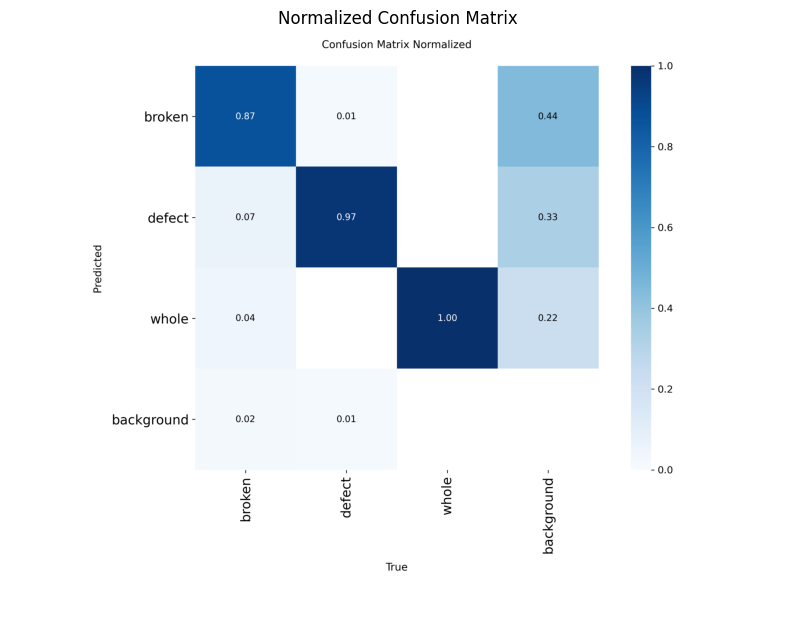

In [ ]:
import matplotlib.image as mpimg

val_dir = metrics.save_dir

cm_path = os.path.join(val_dir, 'confusion_matrix_normalized.png')
if os.path.exists(cm_path):
    img = mpimg.imread(cm_path)
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Normalized Confusion Matrix')
    plt.show()
else:
    print("Không tìm thấy file confusion matrix. Hãy kiểm tra lại thư mục chạy val.")

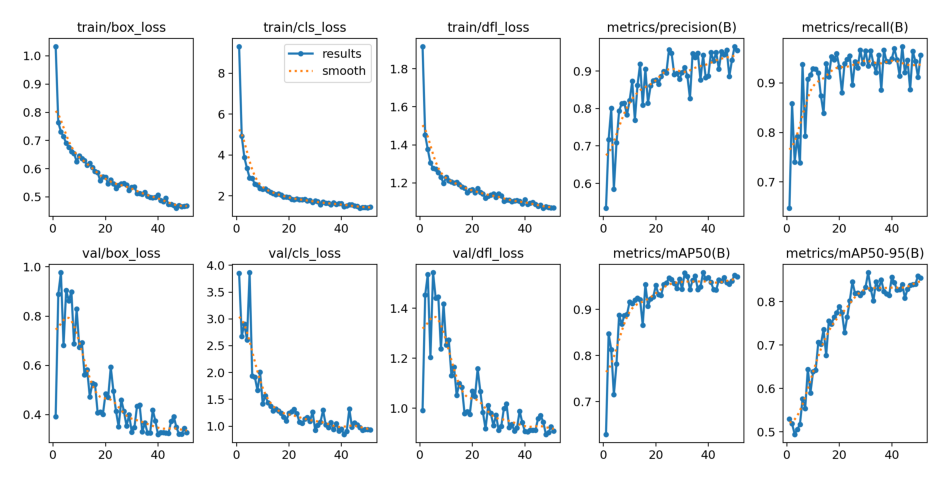

In [ ]:
results_path = os.path.join(os.path.dirname(os.path.dirname(model_path)), 'results.png')

if os.path.exists(results_path):
    img = mpimg.imread(results_path)
    plt.figure(figsize=(12, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image 1/1 /content/esp32.jpg: 480x640 1 defect, 55.7ms
Speed: 3.8ms preprocess, 55.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


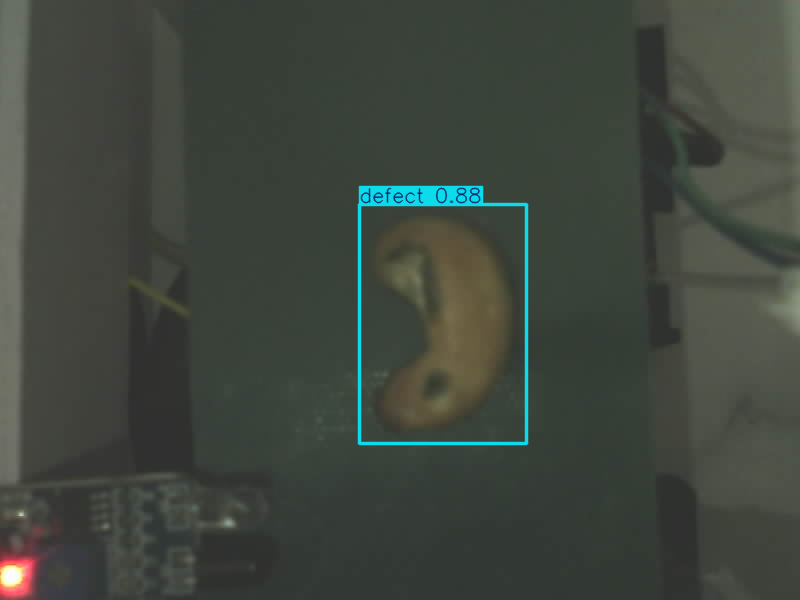

In [16]:
from google.colab.patches import cv2_imshow
import cv2

test_image = 'esp32.jpg'

results = model.predict(source=test_image, save=True)

for result in results:
    probs = result.probs
    res_plotted = result.plot()
    cv2_imshow(res_plotted)


image 1/1 /content/test2.jpg: 640x640 2 brokens, 2 defects, 45.8ms
Speed: 17.9ms preprocess, 45.8ms inference, 12.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/predict


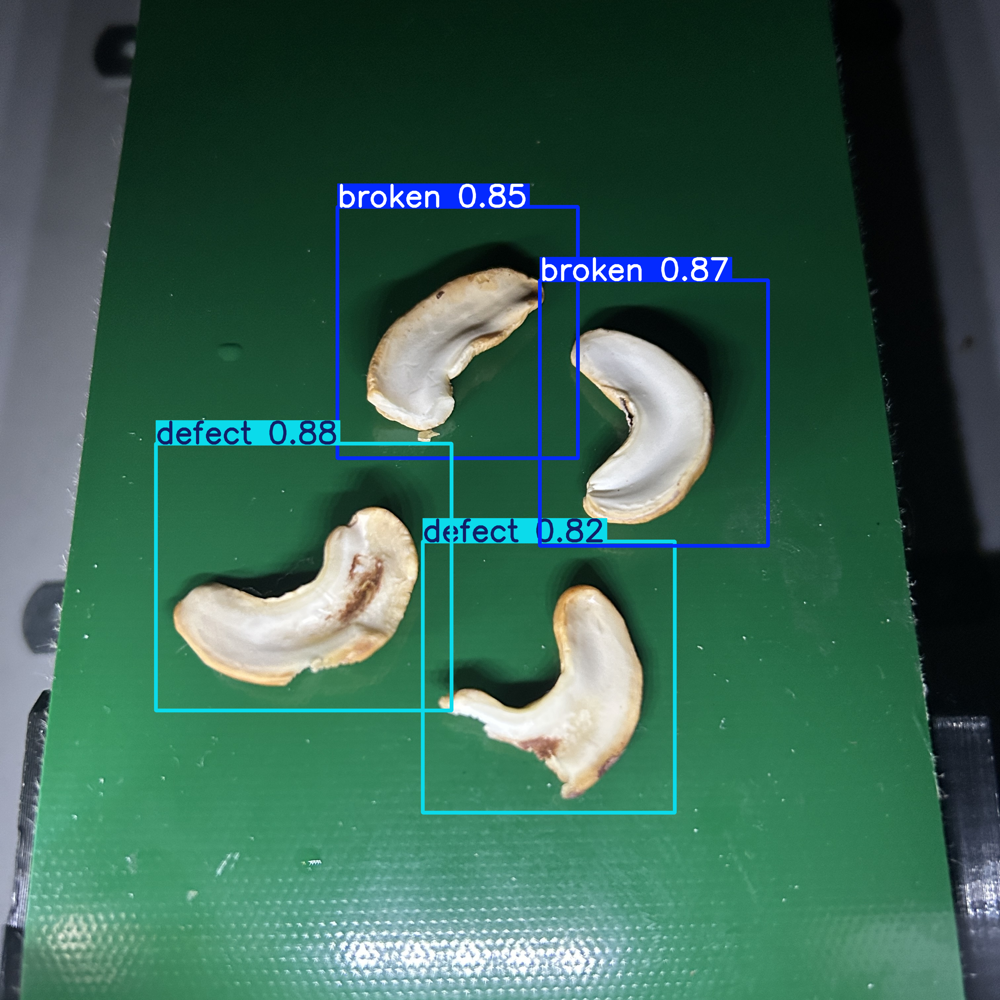

In [17]:
from google.colab.patches import cv2_imshow
import cv2
test_image = 'test2.jpg'

results = model.predict(source=test_image,
                        conf=0.45,
                        iou=0.3,
                        save=True)

for result in results:
    probs = result.probs
    res_plotted = result.plot()
    cv2_imshow(res_plotted)